<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/original_vit_50epoch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#パッケージのダウンロード


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim

In [5]:
import torchvision.transforms as transforms

In [6]:
import torchvision.datasets as dset

In [7]:
import torchvision.utils as vutils

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [9]:
import glob

In [10]:
from torch.utils.data import Dataset
from PIL import Image

In [11]:
from torch.utils.data import DataLoader
import torchvision

In [12]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 9.6 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 467MB/s]


In [13]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [14]:
#ハイパーパラメータの設定

In [15]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=128)
parser.add_argument("--nch_d", type = int, default=128)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=128, nch_d=128, z_dim=100, beta1=0.5)


In [16]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [17]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [18]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [19]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [20]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [21]:
#モデルの設定

In [22]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [23]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [24]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [25]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)#(B,H*W softmax, H*W)

        o =torch.bmm(hx, attention)#(b,c,h*w )*(B,H*W softmax, H*W) -> (b,c,h*w)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [26]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [27]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [28]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [29]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [30]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2 \n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels) \n        self.bn =

In [31]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [32]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [33]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [34]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding \n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [35]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
       # x = self.se_block_0(x)
        x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
        b, c, h, w = x.size()
        #x = self.conv1(x)
       # x= self.flat(x)
        #print(x.size())

        x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
        x = self.linear_2(x).view(b, -1, h, w)

        #x = x.view(b, -1, h, w)
        #print(x.size())
        #print(self.shortcut(identity).size())
        x =  self.shortcut(identity) + x

        #x = self.se_block_1(x)
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [36]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [37]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [38]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [39]:
#モデルのトレーニング

In [40]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [41]:
device

device(type='cuda')

In [42]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): Conv

In [43]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [02:29<00:00,  1.45s/it]


epoch: 0, lossD:2.190593676659667, lossG:4.693910765416414,lossG_fake:2.3908900844240653, lossG_real:2.3030206775202333 ,equality:0.08786940690383194


evaluate:121.4006576538086,kid_mean:0.09192568808794022, kid_std:0.015438769944012165,kid_:(tensor(0.0919), tensor(0.0154))


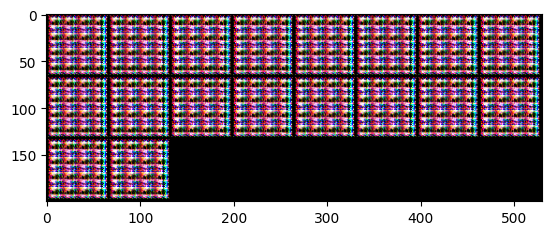

100%|██████████| 103/103 [01:36<00:00,  1.07it/s]


epoch: 1, lossD:1.766202242629042, lossG:3.4726949941764755,lossG_fake:1.9083226629831258, lossG_real:1.564372343924439 ,equality:0.3439503190586868


evaluate:102.33185577392578,kid_mean:0.0601784884929657, kid_std:0.024935048073530197,kid_:(tensor(0.0602), tensor(0.0249))


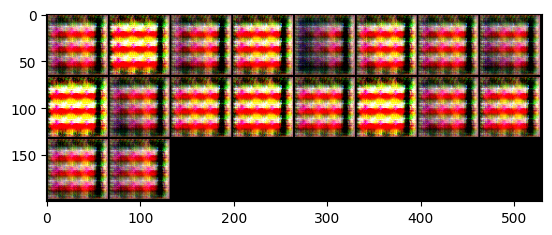

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 2, lossD:1.879695659702264, lossG:2.608969514809766,lossG_fake:1.3895628186105524, lossG_real:1.2194066973565851 ,equality:0.17015612125396729


evaluate:95.0088882446289,kid_mean:0.05694985389709473, kid_std:0.03040764294564724,kid_:(tensor(0.0569), tensor(0.0304))


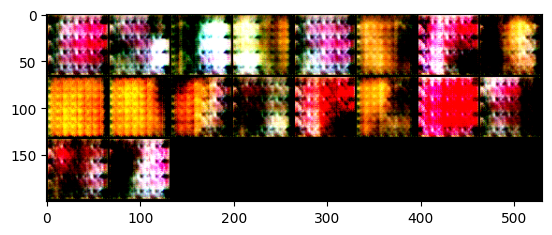

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 3, lossD:2.024102135769372, lossG:2.0955277831809034,lossG_fake:1.0599015586584517, lossG_real:1.0356262123700484 ,equality:0.024275346288403332


evaluate:95.4688949584961,kid_mean:0.05508126690983772, kid_std:0.03044276125729084,kid_:(tensor(0.0551), tensor(0.0304))


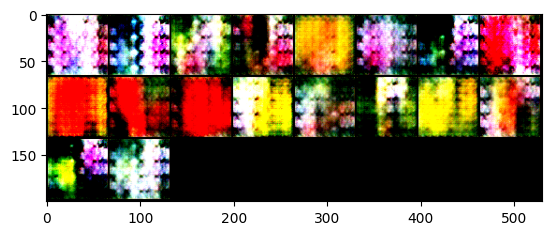

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 4, lossD:2.0162159956774666, lossG:2.078024023944892,lossG_fake:1.0573892882726725, lossG_real:1.0206347240985019 ,equality:0.03675456417417067


evaluate:104.26224517822266,kid_mean:0.060416799038648605, kid_std:0.030112626031041145,kid_:(tensor(0.0604), tensor(0.0301))


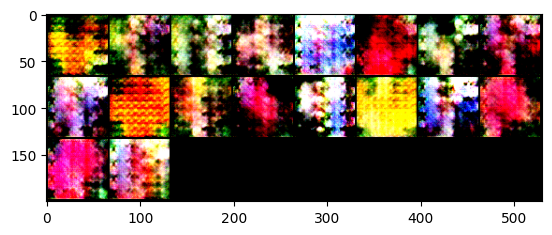

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 5, lossD:2.0186585917056186, lossG:2.068594036750423,lossG_fake:1.0620266297488536, lossG_real:1.0065674237834596 ,equality:0.055459205965394


evaluate:96.43643188476562,kid_mean:0.052916496992111206, kid_std:0.027970029041171074,kid_:(tensor(0.0529), tensor(0.0280))


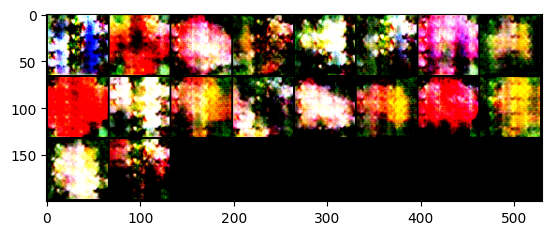

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 6, lossD:2.042647051579744, lossG:2.0858260890812548,lossG_fake:1.0675292587974696, lossG_real:1.018296840700131 ,equality:0.04923241809733869


evaluate:93.05182647705078,kid_mean:0.05658828839659691, kid_std:0.03463134542107582,kid_:(tensor(0.0566), tensor(0.0346))


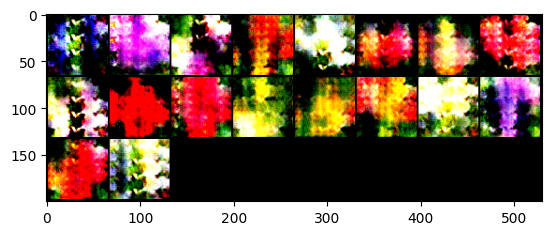

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 7, lossD:2.0154127044585146, lossG:2.054500414329825,lossG_fake:1.064122790271796, lossG_real:0.9903776119056257 ,equality:0.07374517836617034


evaluate:96.48539733886719,kid_mean:0.05376827344298363, kid_std:0.029338303953409195,kid_:(tensor(0.0538), tensor(0.0293))


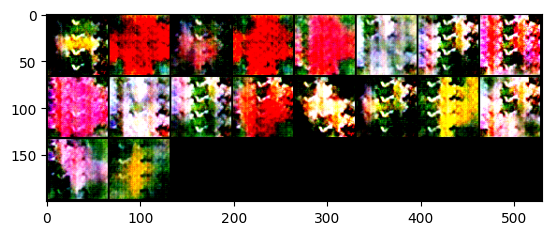

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 8, lossD:2.0122896675924653, lossG:2.0532243251800537,lossG_fake:1.0626108229738995, lossG_real:0.9906135016274684 ,equality:0.07199732134643111


evaluate:90.97174072265625,kid_mean:0.05280815064907074, kid_std:0.0320577546954155,kid_:(tensor(0.0528), tensor(0.0321))


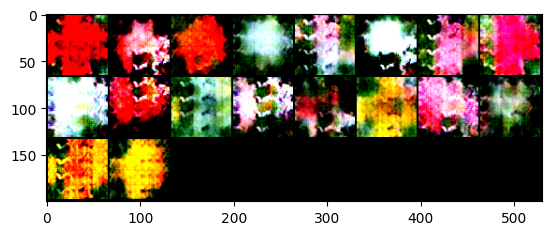

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 9, lossD:2.016469397591156, lossG:2.0761882842165753,lossG_fake:1.0811803306190713, lossG_real:0.9950079588056768 ,equality:0.08617237181339443


evaluate:97.06846618652344,kid_mean:0.055871590971946716, kid_std:0.0303408931940794,kid_:(tensor(0.0559), tensor(0.0303))


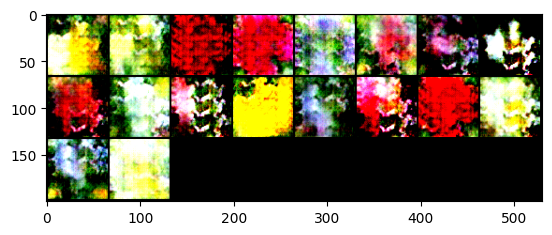

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 10, lossD:2.00190416007366, lossG:2.074665796409533,lossG_fake:1.0641629695892334, lossG_real:1.0105028320284724 ,equality:0.053660137560761045


evaluate:95.24726867675781,kid_mean:0.05729275196790695, kid_std:0.032127052545547485,kid_:(tensor(0.0573), tensor(0.0321))


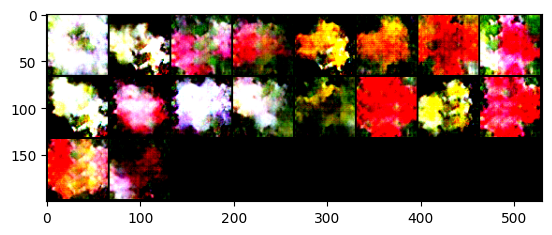

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 11, lossD:2.0077451849446715, lossG:2.075147320923296,lossG_fake:1.062160935216737, lossG_real:1.0129863978589622 ,equality:0.04917453735777477


evaluate:100.70822143554688,kid_mean:0.05901351943612099, kid_std:0.03393715247511864,kid_:(tensor(0.0590), tensor(0.0339))


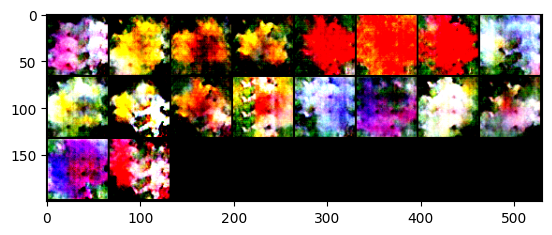

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 12, lossD:1.999878673877531, lossG:2.0586478374536754,lossG_fake:1.0643879829101193, lossG_real:0.9942598441272106 ,equality:0.07012813878290869


evaluate:104.1393051147461,kid_mean:0.058456867933273315, kid_std:0.031238019466400146,kid_:(tensor(0.0585), tensor(0.0312))


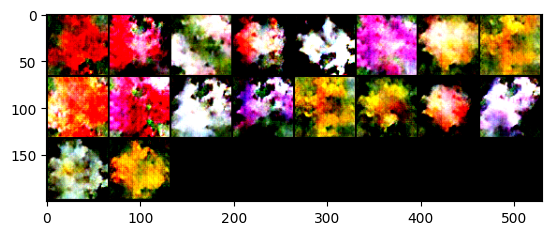

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 13, lossD:2.000266202445169, lossG:2.0614749389944724,lossG_fake:1.0603284633275374, lossG_real:1.001146479717736 ,equality:0.059181983609801314


evaluate:106.00029754638672,kid_mean:0.06503719091415405, kid_std:0.033038362860679626,kid_:(tensor(0.0650), tensor(0.0330))


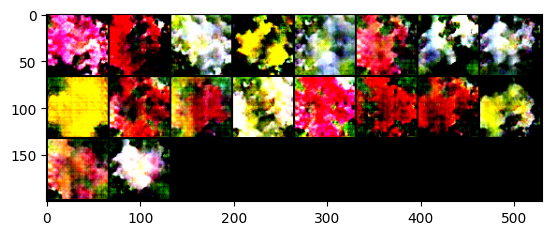

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 14, lossD:1.999303765667295, lossG:2.0626336694921106,lossG_fake:1.0475531012109183, lossG_real:1.015080556128789 ,equality:0.03247254508212927


evaluate:109.8656005859375,kid_mean:0.06686090677976608, kid_std:0.0385657474398613,kid_:(tensor(0.0669), tensor(0.0386))


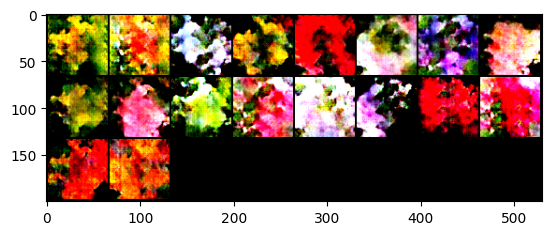

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 15, lossD:1.9986108553062365, lossG:2.0674070270316114,lossG_fake:1.0603693069763553, lossG_real:1.007037720055256 ,equality:0.053331586921099294


evaluate:112.40633392333984,kid_mean:0.0717269778251648, kid_std:0.036489661782979965,kid_:(tensor(0.0717), tensor(0.0365))


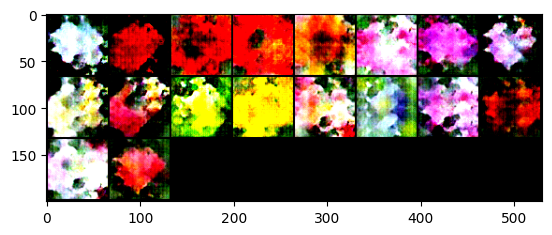

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 16, lossD:2.000223618109249, lossG:2.07129566877791,lossG_fake:1.050913696150178, lossG_real:1.0203819656835018 ,equality:0.03053173046667612


evaluate:112.05500030517578,kid_mean:0.07260427623987198, kid_std:0.03250552713871002,kid_:(tensor(0.0726), tensor(0.0325))


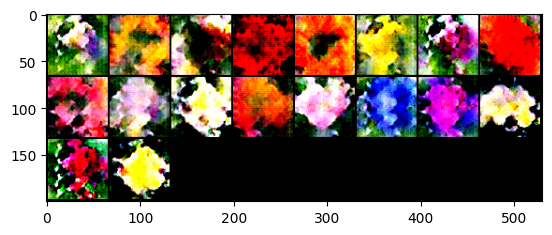

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 17, lossD:1.9931206379121946, lossG:2.0705505042400176,lossG_fake:1.0635211247842289, lossG_real:1.0070293916081918 ,equality:0.05649173317603706


evaluate:112.69218444824219,kid_mean:0.07426398992538452, kid_std:0.03857104480266571,kid_:(tensor(0.0743), tensor(0.0386))


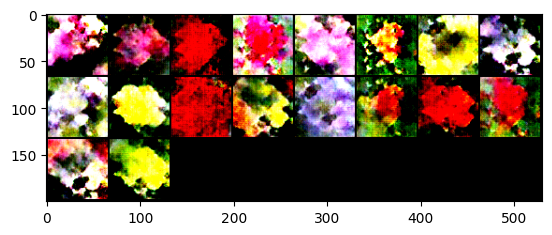

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 18, lossD:2.003656920877475, lossG:2.080637193420558,lossG_fake:1.0479089172141065, lossG_real:1.0327282709982788 ,equality:0.015180646215827709


evaluate:111.08594512939453,kid_mean:0.06788888573646545, kid_std:0.03357260301709175,kid_:(tensor(0.0679), tensor(0.0336))


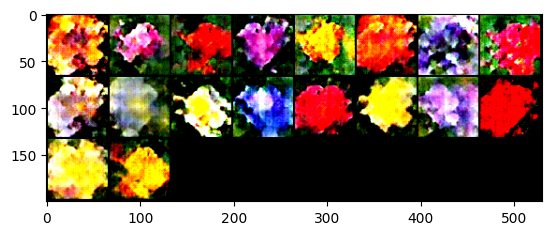

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 19, lossD:2.0035339536018744, lossG:2.073206686279149,lossG_fake:1.051875718588968, lossG_real:1.0213309694262385 ,equality:0.030544749162729534


evaluate:114.78614044189453,kid_mean:0.08366324752569199, kid_std:0.04053402319550514,kid_:(tensor(0.0837), tensor(0.0405))


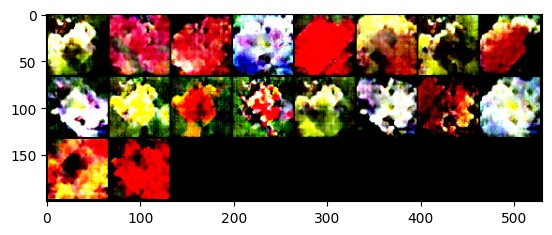

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 20, lossD:2.0094720310377845, lossG:2.0866175739510546,lossG_fake:1.0542204721460064, lossG_real:1.0323971139574515 ,equality:0.021823358188554964


evaluate:112.7253646850586,kid_mean:0.07457593828439713, kid_std:0.040939267724752426,kid_:(tensor(0.0746), tensor(0.0409))


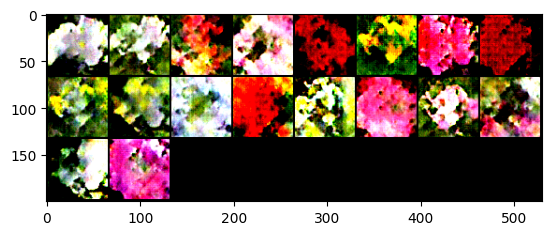

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 21, lossD:2.0015710187189786, lossG:2.080414427136912,lossG_fake:1.0612916089956044, lossG_real:1.0191227949938728 ,equality:0.04216881400173156


evaluate:114.40632629394531,kid_mean:0.07496172189712524, kid_std:0.040998149663209915,kid_:(tensor(0.0750), tensor(0.0410))


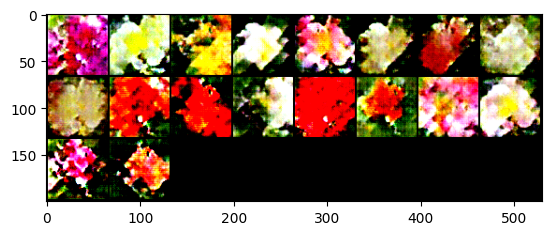

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 22, lossD:1.9978182107499503, lossG:2.0812421354275306,lossG_fake:1.0718128061988978, lossG_real:1.0094293379089208 ,equality:0.062383468289977095


evaluate:114.17896270751953,kid_mean:0.07347369194030762, kid_std:0.033836573362350464,kid_:(tensor(0.0735), tensor(0.0338))


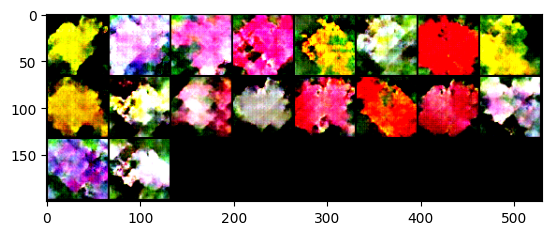

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 23, lossD:1.9974587264570218, lossG:2.093343230127131,lossG_fake:1.0561016514463333, lossG_real:1.0372415850463423 ,equality:0.018860066399990938


evaluate:113.67940521240234,kid_mean:0.07384634017944336, kid_std:0.03876956179738045,kid_:(tensor(0.0738), tensor(0.0388))


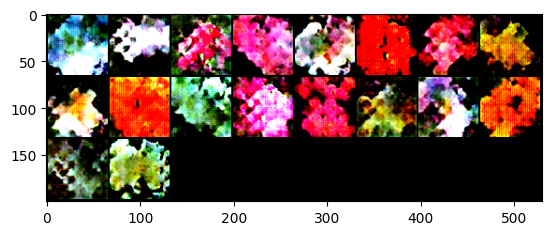

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 24, lossD:1.9983987194820516, lossG:2.103735349710705,lossG_fake:1.0733118543347109, lossG_real:1.0304234953759943 ,equality:0.042888358958716566


evaluate:116.07661437988281,kid_mean:0.0816347673535347, kid_std:0.041976794600486755,kid_:(tensor(0.0816), tensor(0.0420))


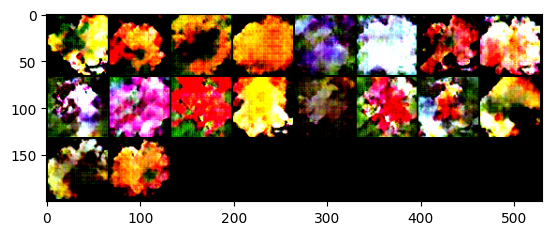

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 25, lossD:1.994453543598212, lossG:2.113045511893856,lossG_fake:1.0916722688860105, lossG_real:1.0213732447439028 ,equality:0.07029902414210776


evaluate:116.4327621459961,kid_mean:0.08184140920639038, kid_std:0.03645017743110657,kid_:(tensor(0.0818), tensor(0.0365))


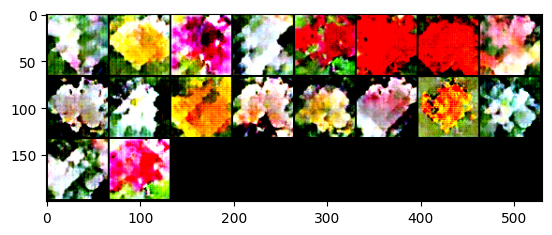

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 26, lossD:1.9836085849595302, lossG:2.1298725072619984,lossG_fake:1.0964016138928607, lossG_real:1.0334708881609649 ,equality:0.06293072573189584


evaluate:115.03633880615234,kid_mean:0.07612693309783936, kid_std:0.044704314321279526,kid_:(tensor(0.0761), tensor(0.0447))


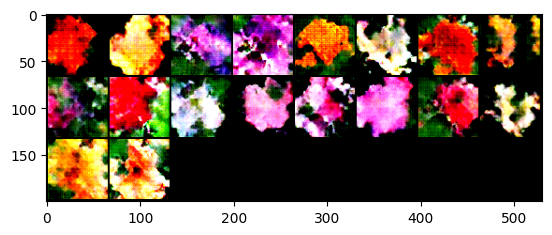

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 27, lossD:1.985216669665957, lossG:2.174739536729831,lossG_fake:1.110510090601097, lossG_real:1.0642294443926765 ,equality:0.04628064620842043


evaluate:115.0655288696289,kid_mean:0.08374645560979843, kid_std:0.04211030900478363,kid_:(tensor(0.0837), tensor(0.0421))


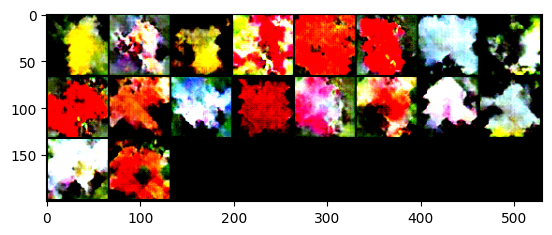

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 28, lossD:1.9641495676873957, lossG:2.232566335826244,lossG_fake:1.15232167429137, lossG_real:1.0802446511185284 ,equality:0.07207702317284159


evaluate:115.63604736328125,kid_mean:0.07851564884185791, kid_std:0.04029722511768341,kid_:(tensor(0.0785), tensor(0.0403))


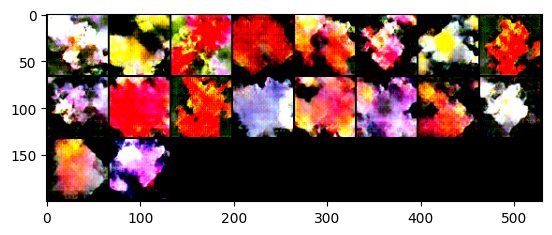

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 29, lossD:1.9434795379638672, lossG:2.2393981669712995,lossG_fake:1.1490258285142843, lossG_real:1.090372347715989 ,equality:0.05865348079829524


evaluate:113.92371368408203,kid_mean:0.06982550024986267, kid_std:0.03476560115814209,kid_:(tensor(0.0698), tensor(0.0348))


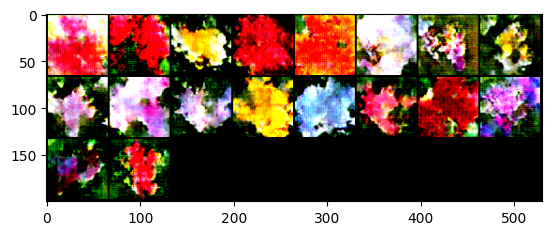

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 30, lossD:1.9186586940172807, lossG:2.3285209252996353,lossG_fake:1.1982984797468463, lossG_real:1.1302224415019877 ,equality:0.06807603824485864


evaluate:114.17195129394531,kid_mean:0.07578327506780624, kid_std:0.03335699439048767,kid_:(tensor(0.0758), tensor(0.0334))


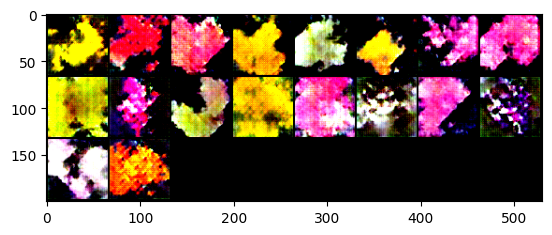

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 31, lossD:1.859767676557152, lossG:2.485852859552624,lossG_fake:1.2741745802962665, lossG_real:1.2116782723121273 ,equality:0.06249630798413919


evaluate:114.62725830078125,kid_mean:0.079244464635849, kid_std:0.04035659506917,kid_:(tensor(0.0792), tensor(0.0404))


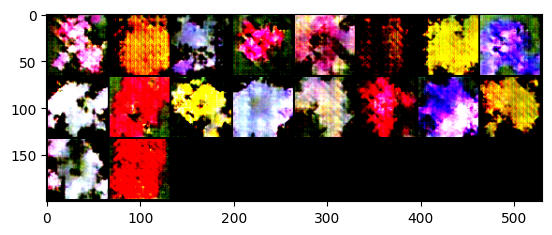

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 32, lossD:1.7958996874614828, lossG:2.646923118424647,lossG_fake:1.358139801951288, lossG_real:1.2887832933259242 ,equality:0.0693565086253638


evaluate:114.7564468383789,kid_mean:0.08022819459438324, kid_std:0.046496931463479996,kid_:(tensor(0.0802), tensor(0.0465))


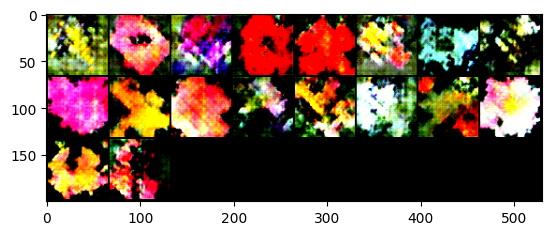

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 33, lossD:1.764562833656385, lossG:2.7914389869541796,lossG_fake:1.44769816259736, lossG_real:1.3437408255141916 ,equality:0.10395733708316834


evaluate:113.7944564819336,kid_mean:0.0750051811337471, kid_std:0.03857333958148956,kid_:(tensor(0.0750), tensor(0.0386))


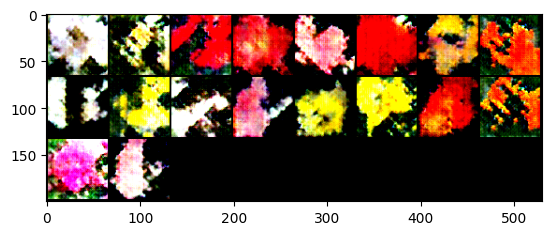

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 34, lossD:1.6750022138206704, lossG:2.8746971297032626,lossG_fake:1.4769871767284801, lossG_real:1.3977099437158085 ,equality:0.07927723301267164


evaluate:113.27397918701172,kid_mean:0.07078640908002853, kid_std:0.03450297936797142,kid_:(tensor(0.0708), tensor(0.0345))


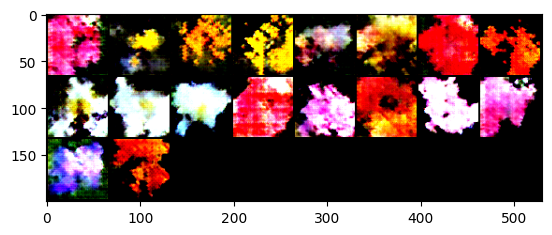

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 35, lossD:1.5183232889592069, lossG:3.346140863825974,lossG_fake:1.7220244696996745, lossG_real:1.6241163981771005 ,equality:0.09790807152257397


evaluate:114.66525268554688,kid_mean:0.07680219411849976, kid_std:0.040888600051403046,kid_:(tensor(0.0768), tensor(0.0409))


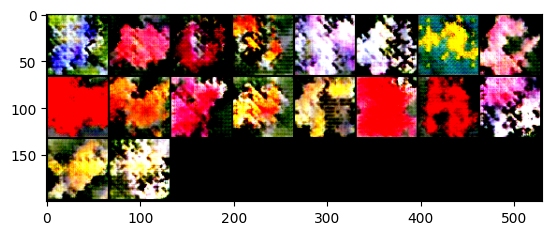

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 36, lossD:1.3678783467672404, lossG:3.699982136198618,lossG_fake:1.9257810636631494, lossG_real:1.7742010719567827 ,equality:0.1515799917063667


evaluate:116.08867645263672,kid_mean:0.07739493995904922, kid_std:0.035115525126457214,kid_:(tensor(0.0774), tensor(0.0351))


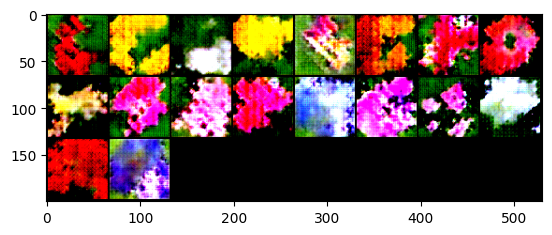

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 37, lossD:1.2109464846768425, lossG:4.04818163566219,lossG_fake:2.1433541334948494, lossG_real:1.9048274920403379 ,equality:0.23852664145451152


evaluate:116.03289794921875,kid_mean:0.07735469192266464, kid_std:0.0397932305932045,kid_:(tensor(0.0774), tensor(0.0398))


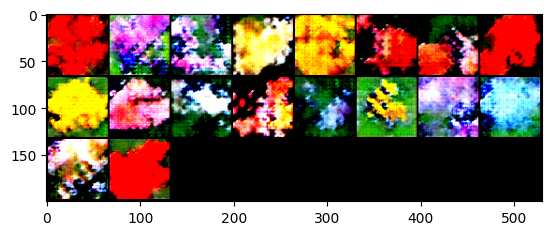

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 38, lossD:1.04067325049523, lossG:4.478461696106253,lossG_fake:2.3055020483952124, lossG_real:2.1729596095177732 ,equality:0.13254243887743922


evaluate:116.28620910644531,kid_mean:0.07268685102462769, kid_std:0.04013136774301529,kid_:(tensor(0.0727), tensor(0.0401))


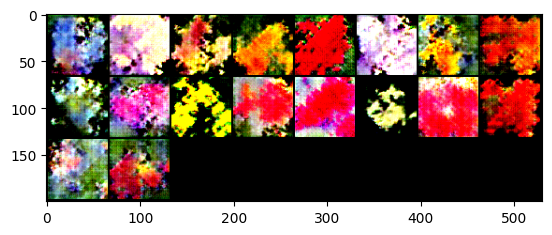

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 39, lossD:1.0206644633441295, lossG:4.506605185351326,lossG_fake:2.38469476375765, lossG_real:2.121910431720678 ,equality:0.26278433203697205


evaluate:115.9976577758789,kid_mean:0.07544111460447311, kid_std:0.04128127917647362,kid_:(tensor(0.0754), tensor(0.0413))


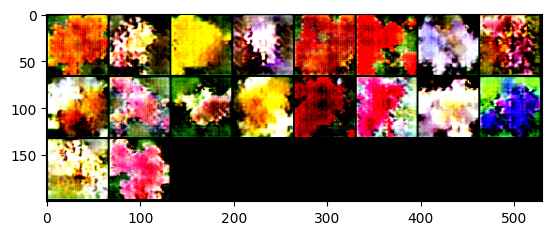

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 40, lossD:0.7968659157891875, lossG:5.083631670590743,lossG_fake:2.6823995466371184, lossG_real:2.401232135527342 ,equality:0.2811674111097764


evaluate:115.53321838378906,kid_mean:0.07191937416791916, kid_std:0.04078303650021553,kid_:(tensor(0.0719), tensor(0.0408))


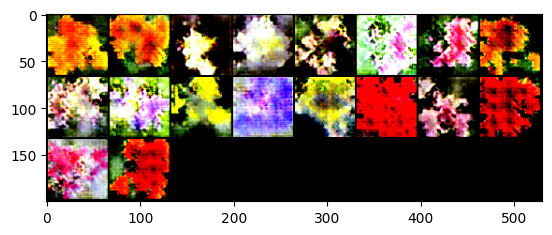

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 41, lossD:0.7058629398641078, lossG:5.182200510525009,lossG_fake:2.6850821561026343, lossG_real:2.4971183341683694 ,equality:0.18796382193426497


evaluate:116.63703918457031,kid_mean:0.07496798783540726, kid_std:0.036437027156353,kid_:(tensor(0.0750), tensor(0.0364))


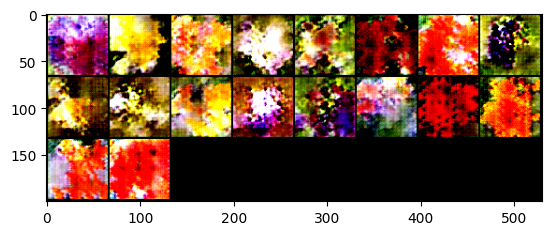

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 42, lossD:0.5725868721356959, lossG:5.6820995853942575,lossG_fake:2.9508839446364097, lossG_real:2.7312156286054443 ,equality:0.21966831603096537


evaluate:115.6539535522461,kid_mean:0.07641100883483887, kid_std:0.0367518775165081,kid_:(tensor(0.0764), tensor(0.0368))


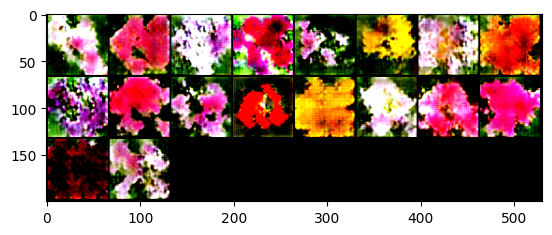

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 43, lossD:0.49755630751583474, lossG:5.695819877883763,lossG_fake:2.9150554069037575, lossG_real:2.780764492391383 ,equality:0.13429091451237474


evaluate:116.34491729736328,kid_mean:0.07390792667865753, kid_std:0.03532695770263672,kid_:(tensor(0.0739), tensor(0.0353))


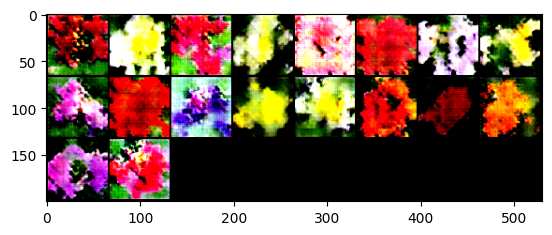

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 44, lossD:0.6145839564936254, lossG:5.5509532030346325,lossG_fake:2.8441882040894146, lossG_real:2.7067650058894484 ,equality:0.1374231981999663


evaluate:115.75653076171875,kid_mean:0.0724894106388092, kid_std:0.035221632570028305,kid_:(tensor(0.0725), tensor(0.0352))


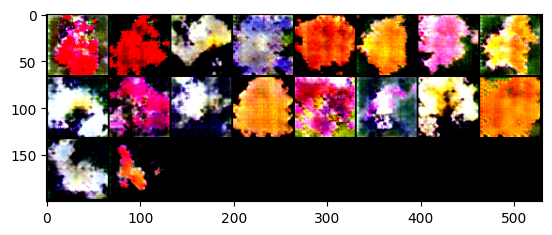

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 45, lossD:0.6122430325350137, lossG:5.531476613387321,lossG_fake:2.852430933887519, lossG_real:2.679045652880252 ,equality:0.1733852810072669


evaluate:115.67028045654297,kid_mean:0.07455547153949738, kid_std:0.03876456245779991,kid_:(tensor(0.0746), tensor(0.0388))


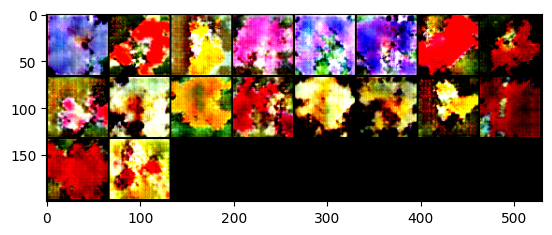

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 46, lossD:0.48225946023210303, lossG:6.150536421433236,lossG_fake:3.1139875089080586, lossG_real:3.036548916575978 ,equality:0.07743859233208061


evaluate:116.03218841552734,kid_mean:0.07142248004674911, kid_std:0.036747805774211884,kid_:(tensor(0.0714), tensor(0.0367))


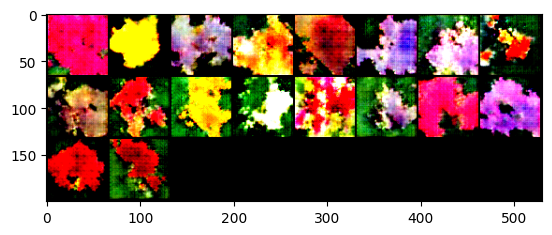

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 47, lossD:0.5677967040880936, lossG:6.057895433555529,lossG_fake:3.1100548899289473, lossG_real:2.9478405580937284 ,equality:0.16221433183521894


evaluate:115.54615020751953,kid_mean:0.07350663095712662, kid_std:0.036342110484838486,kid_:(tensor(0.0735), tensor(0.0363))


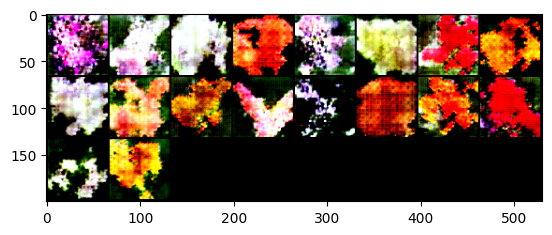

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 48, lossD:0.5992219204092127, lossG:5.807762835789653,lossG_fake:2.9652387268334914, lossG_real:2.8425241025906165 ,equality:0.12271462424287494


evaluate:116.06441497802734,kid_mean:0.0728616714477539, kid_std:0.0390816293656826,kid_:(tensor(0.0729), tensor(0.0391))


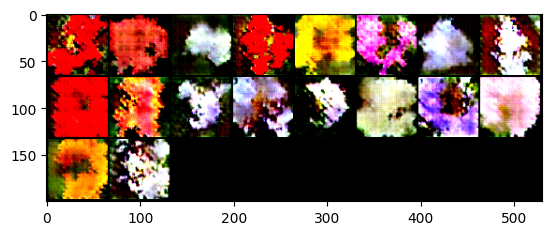

100%|██████████| 103/103 [01:38<00:00,  1.05it/s]


epoch: 49, lossD:0.5522719644263242, lossG:5.8380162808501606,lossG_fake:2.8994382677726374, lossG_real:2.9385780153922663 ,equality:-0.039139747619628906


evaluate:117.70018005371094,kid_mean:0.07519780844449997, kid_std:0.03734423592686653,kid_:(tensor(0.0752), tensor(0.0373))


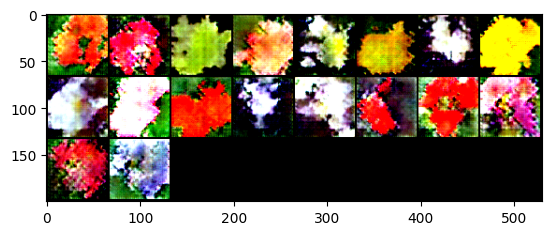

In [44]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

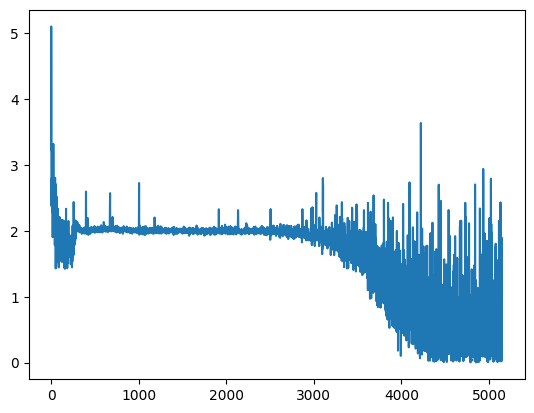

In [45]:
plt.plot(raw_lossesD)

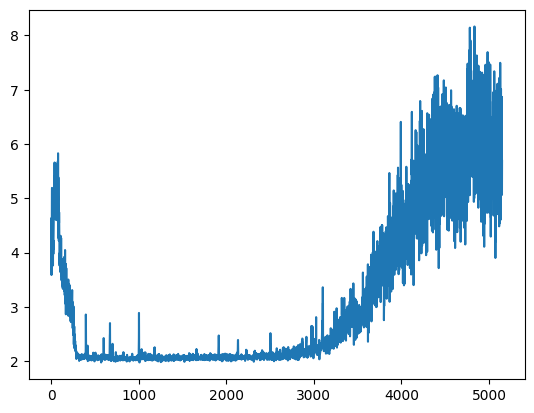

In [46]:
plt.plot(raw_lossesG)

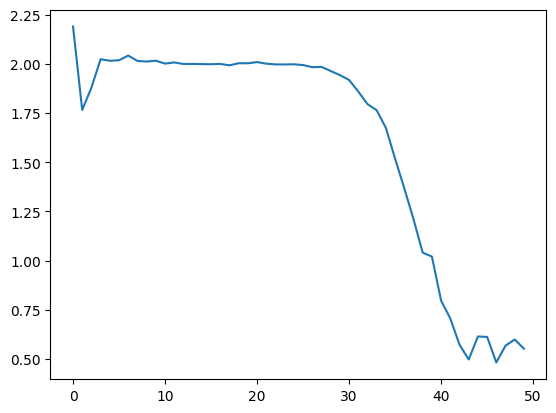

In [47]:
plt.plot(lossesD)

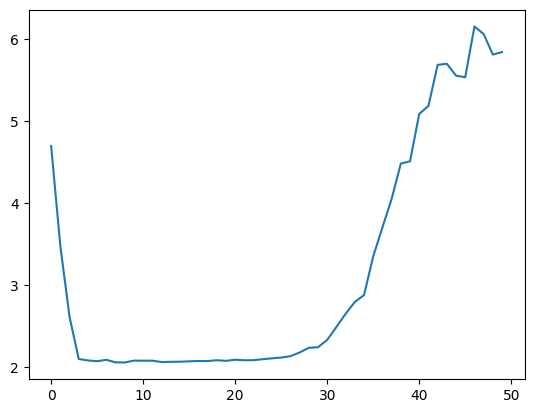

In [48]:
plt.plot(lossesG)

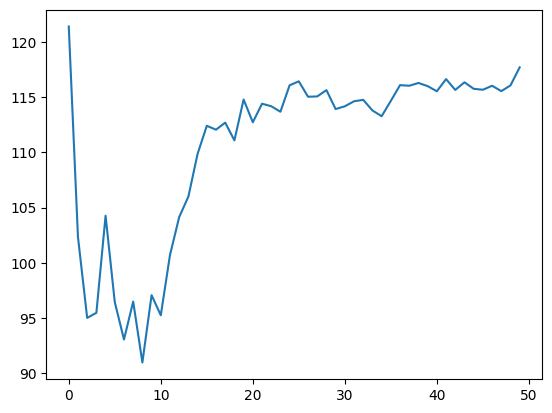

In [49]:
plt.plot(fid_)

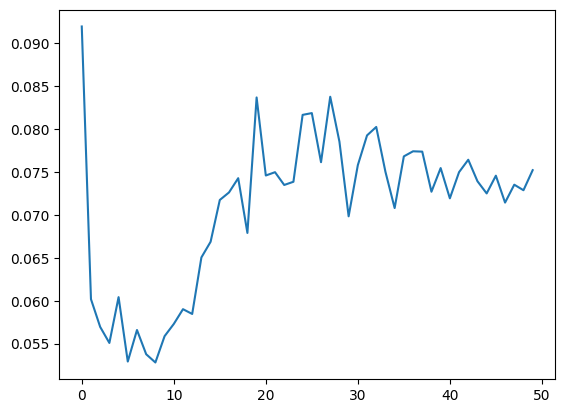

In [50]:
plt.plot(kid_mean_)

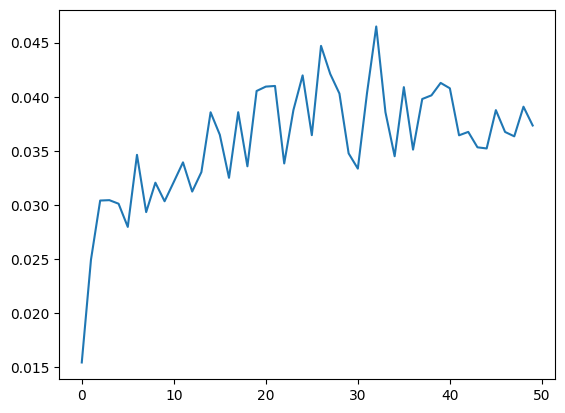

In [51]:
plt.plot(kid_std_)

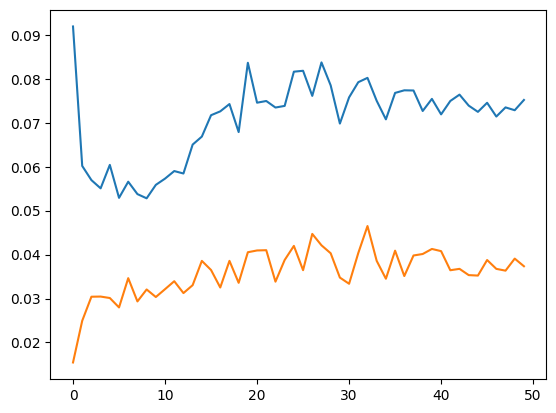

In [52]:
plt.plot(kid_score)

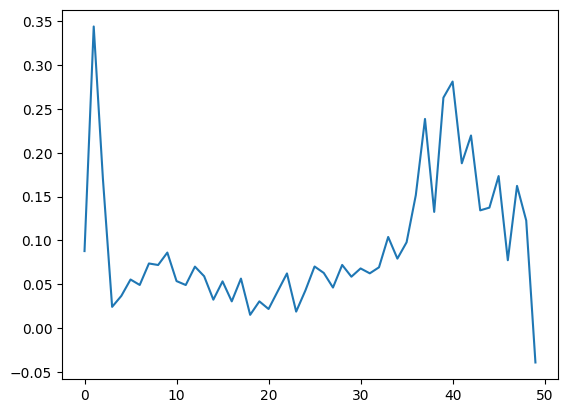

In [53]:
plt.plot(d_equality)

In [54]:

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
fid.compute()

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
kid.compute()

(tensor(0.0720), tensor(0.0394))